# Compute moving feature on NOAA dataset

In [8]:
# For multiple output per cell
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"

# Full script

In [6]:
%%writefile 02_spark_pipeline_country_ISO3.py
from pyspark import SparkContext
#from pyspark import SparkConf
from pyspark.sql import SparkSession
from pyspark.sql.window import Window
from pyspark.sql.types import FloatType # Spark Date type
#from pyspark.sql.functions import to_timestamp
import pyspark.sql.functions as F

import shutil
#import pandas as pd

DATASET_FOLDER = '/media/data-nvme/dev/datasets/WorldBank/'
SPARK_MASTER = 'spark://192.168.0.9:7077'
APP_NAME = 'Compute moving feature on NOAA dataset'

input_folder = DATASET_FOLDER + 'daily_rain_by_country'
output = DATASET_FOLDER + 'daily_rain_by_country_ISO3'
country_codes = DATASET_FOLDER + 'country-codes.csv'

print('Create Spark session')
spark = SparkSession.builder.master(SPARK_MASTER).appName(APP_NAME).config("spark.driver.memory", "20g").getOrCreate()

print('Load NOAA data')
df = spark.read.format('csv').option('header',False).option('multiLine', True).load(input_folder).toDF('date', 'country_ISO2', 'avg_rain', 'sum_rain', 'max_rain', 'stddev_rain', 'station_count')
df=df.dropna()
df.createOrReplaceTempView("noaa")

##############################################################################
####### Join country code to have ISO3 instead of FIPS
print('Load table of country code')
df_country_codes = spark.read.format('csv').option('header',True).option('multiLine', True).load(country_codes)
df_country_codes.createOrReplaceTempView("country_codes")

df.createOrReplaceTempView("noaa")
print('Join NOAA and countries')
df_full = spark.sql("""SELECT country_ISO2, country_codes.`ISO3166-1-Alpha-3` as country_ISO3, date, avg_rain, sum_rain, max_rain, stddev_rain, station_count 
                            FROM noaa LEFT JOIN country_codes ON noaa.country_ISO2=country_codes.FIPS
                            """)

print('Manualy setting Serbia to SRB')
df_full = df_full.withColumn("country_ISO3",
                             F.when(F.col("country_ISO2") == "RI", 'SRB').otherwise(F.col("country_ISO3")))
df_full.createOrReplaceTempView("noaa")

print('Remove timestamp')
df_full = df_full.drop('country_ISO2')

print('Saving to disk...')
shutil.rmtree(output, ignore_errors=True)
df_full.write.csv(output)
print(df_full.columns)
header = ', '.join(df_full.columns)
print(header)
print('End Spark session')
spark.stop()

Overwriting 02_spark_pipeline_country_ISO3.py


In [ ]:
%%writefile spark_pipeline_03_compute_features.py
from pyspark import SparkContext
#from pyspark import SparkConf
from pyspark.sql import SparkSession
from pyspark.sql.window import Window
from pyspark.sql.types import FloatType # Spark Date type
#from pyspark.sql.functions import to_timestamp
import pyspark.sql.functions as F

import shutil
#import pandas as pd

DATASET_FOLDER = '/media/data-nvme/dev/datasets/WorldBank/'
SPARK_MASTER = 'spark://192.168.0.9:7077'
APP_NAME = 'Compute moving feature on NOAA dataset'

input_folder = DATASET_FOLDER + 'daily_rain_by_country_ISO3'
output = DATASET_FOLDER + 'daily_rain_by_country_feature'

print('Create Spark session')
spark = SparkSession.builder.master(SPARK_MASTER).appName(APP_NAME).config("spark.driver.memory", "20g").getOrCreate()

print('Load NOAA data')
df = spark.read.format('csv').option('header',False).option('multiLine', True).load(input_folder)\
    .toDF('country_ISO3', 'date', 'avg_rain', 'sum_rain', 'max_rain', 'stddev_rain', 'station_count')
df=df.dropna()
df.createOrReplaceTempView("noaa")


##############################################################################
###### Cast Type
print('Cast string to float')
df_full = df.withColumn("avg_rain", df["avg_rain"].cast(FloatType()))\
    .withColumn("sum_rain", df["sum_rain"].cast(FloatType())) \
    .withColumn("max_rain", df["max_rain"].cast(FloatType()))

print('Cast date to timestamp')
df_full = df_full.withColumn("date_with_time", F.to_timestamp(df_full.date, 'yyyy-MM-dd'))

print('Helper function to compute number of second in a day')
days = lambda d:d*24*60*60

#############################################################################
##### Compute new features
# Thanks to  https://kevinvecmanis.io/pyspark/data%20science/python/2019/06/02/SPX-Analysis-With-PySpark.html
print('Define a window to make computation')
windowSpec = Window.partitionBy(['country_ISO3']).orderBy(F.col("date_with_time").cast("long"))

df_rolling = df_full
print('Compute moving average and sum')
for d in [5,10,20]:# ,30,60
    # Moving Sum of rain
    df_rolling = df_rolling.withColumn('last_'+str(d)+'_days_sum', F.sum("avg_rain").over(windowSpec.rangeBetween(-days(d), 0)))
    # Moving average of rain
    df_rolling = df_rolling.withColumn('last_'+str(d)+'_days_avg', F.avg("avg_rain").over(windowSpec.rangeBetween(-days(d), 0)))
    # Moving max of rain
    df_rolling = df_rolling.withColumn('last_'+str(d)+'_days_max', F.max("max_rain").over(windowSpec.rangeBetween(-days(d), 0)))

print('Remove timestamp')
df_rolling = df_rolling.drop('date_with_time')

print('Saving to disk...')
shutil.rmtree(output, ignore_errors=True)
df_rolling.write.csv(output, header=True)
print(df_rolling.columns)
header = ','.join(df_rolling.columns)
print(header)
print('End Spark session')
spark.stop()

In [8]:
%%writefile spark_pipeline_04_compute_more_features.py
from pyspark import SparkContext
#from pyspark import SparkConf
from pyspark.sql import SparkSession
from pyspark.sql.window import Window
from pyspark.sql.types import FloatType # Spark Date type
#from pyspark.sql.functions import to_timestamp
import pyspark.sql.functions as F

import shutil
#import pandas as pd

DATASET_FOLDER = '/media/data-nvme/dev/datasets/WorldBank/'
SPARK_MASTER = 'spark://192.168.0.9:7077'
APP_NAME = 'Compute moving feature on NOAA dataset'

input_folder = DATASET_FOLDER + 'daily_rain_by_country_feature'
output = DATASET_FOLDER + 'daily_rain_by_country_feature2'

print('Create Spark session')
spark = SparkSession.builder.master(SPARK_MASTER).appName(APP_NAME).config("spark.driver.memory", "20g").getOrCreate()

print('Load NOAA data')
df = spark.read.format('csv').option('header',False).option('multiLine', True).load(input_folder)\
    .toDF('country_ISO3', 'date', 'avg_rain', 'sum_rain', 'max_rain', 'stddev_rain', 'station_count',\
    'last_5_days_sum', 'last_5_days_avg', 'last_5_days_max', 'last_10_days_sum', 'last_10_days_avg',\
    'last_10_days_max', 'last_20_days_sum', 'last_20_days_avg', 'last_20_days_max')
df=df.dropna()
df.createOrReplaceTempView("noaa")


##############################################################################
###### Cast Type
print('Cast string to float')
df_full = df.withColumn("avg_rain", df["avg_rain"].cast(FloatType()))\
    .withColumn("sum_rain", df["sum_rain"].cast(FloatType())) \
    .withColumn("max_rain", df["max_rain"].cast(FloatType()))\
    .withColumn("stddev_rain", df["stddev_rain"].cast(FloatType()))

print('Cast date to timestamp')
df_full = df_full.withColumn("date_with_time", F.to_timestamp(df_full.date, 'yyyy-MM-dd'))

print('Helper function to compute number of second in a day')
days = lambda d:d*24*60*60

#############################################################################
##### Compute new features
# Thanks to  https://kevinvecmanis.io/pyspark/data%20science/python/2019/06/02/SPX-Analysis-With-PySpark.html
print('Define a window to make computation')
windowSpec = Window.partitionBy(['country_ISO3']).orderBy(F.col("date_with_time").cast("long"))

df_rolling = df_full

print('Compute World Bank feature')
# Number of Days per month with Rainfall > 20mm 
#df_rolling = df_rolling.withColumn('days_per_month_with_rainfall_20mm', F.sum("avg_rain").over(windowSpec.rangeBetween(-days(d), 0)))

# Number of Days with Rainfall > 50mm : Average count of days per month or year with at least 50mm of daily rainfall.
#df_rolling = df_rolling.withColumn('days_per_month_with_rainfall_50mm', F.sum("avg_rain").over(windowSpec.rangeBetween(-days(d), 0)))

# Rainfall Amount from Very Wet Days :(Percentage)  Monthly or annual sum of rainfall when the daily
# precipitation rate exceeds the local 95th percentile of daily precipitation intensity.
# TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO
#df_rolling = df_rolling.withColumn('pct_monthly_sum_of_rainfall_50mm', 'todo')

# Largest Single Day Rainfall : (mm) Monthly or annual average of the largest daily rainfall amount
df_rolling = df_rolling.withColumn('max_Daily_month_mm', F.max("max_rain").over(windowSpec.rangeBetween(-days(30), 0)))

# Largest 5-day Cumulative Rainfall : (mm) Monthly or annual average of the largest 5-day consecutive rainfall amount.
df_rolling = df_rolling.withColumn('max_5day_month_mm', F.max("last_5_days_sum").over(windowSpec.rangeBetween(-days(30), 0)))

# Maximum Daily Rainfall (10-yr RL) : (mm) Statistical 10-yr return level of the largest daily rainfall event.
df_rolling = df_rolling.withColumn('max_Daily_10y_mm', F.max("max_rain").over(windowSpec.rangeBetween(-days(30*12*10), 0)))

# Maximum 5-day Rainfall (10-yr RL) : (mm) Statistical 10-yr return level of the largest 5-day consecutive rainfall sum.
df_rolling = df_rolling.withColumn('max_5day_25y_mm', F.max("last_5_days_sum").over(windowSpec.rangeBetween(-days(30*12*10), 0)))

# Maximum Daily Rainfall (25-yr RL) : (mm) Statistical 25-yr return level of the largest daily rainfall event.
df_rolling = df_rolling.withColumn('max_daily_25y_mm', F.max("max_rain").over(windowSpec.rangeBetween(-days(30*12*25), 0)))

# Maximum 5-day Rainfall (25-yr RL) : (mm) Statistical 25-yr return level of the largest 5-day consecutive rainfall sum.
df_rolling = df_rolling.withColumn('max_5day_25y_mm', F.max("last_5_days_sum").over(windowSpec.rangeBetween(-days(30*12*25), 0)))

# Maximum Monthly Rainfall (10-yr RL) : (mm) Statistical 10-yr return level of the largest monthly rainfall sum
df_rolling = df_rolling.withColumn('max_month_10y_mm', F.max("max_rain").over(windowSpec.rangeBetween(-days(30*12*10), 0)))

# Maximum Monthly Rainfall (25-yr RL) : (mm)
df_rolling = df_rolling.withColumn('max_month_25y_mm', F.max("last_30_days_sum").over(windowSpec.rangeBetween(-days(30*12*25), 0)))

print('Remove timestamp')
df_rolling = df_rolling.drop('date_with_time')

print('Saving to disk...')
shutil.rmtree(output, ignore_errors=True)
df_rolling.write.csv(output)
print(df_rolling.columns)
header = ', '.join(df_rolling.columns)
print(header)
print('End Spark session')
spark.stop()

Overwriting 03_spark_pipeline_compute_features.py


In [12]:
output = "/media/data-nvme/dev/datasets/WorldBank/daily_rain_by_country_feature/"

In [13]:
!echo $output
!pwd

/media/data-nvme/dev/datasets/WorldBank/daily_rain_by_country_feature/
/media/data-nvme/dev/src/batch8_worldbank/model_innondations/notebook


%%time
! && workon spark && 
```
export SPARK_HOME="/opt/spark-3.0.1-bin-hadoop3.2/"
spark-submit --master spark://192.168.0.9:7077 --executor-memory 26G --name computefeature /media/data-nvme/dev/src/batch8_worldbank/model_innondations/notebook/spark_pipeline_compute_features.py
```

In [23]:
!echo "country_ISO3,date, avg_rain,sum_rain,max_rain,stddev_rain,station_count,last_5_days_sum,last_5_days_avg,last_5_days_max,last_10_days_sum,last_10_days_avg,last_10_days_max,last_20_days_sum,last_20_days_avg,last_20_days_max" > $output/../daily_rain_by_country_feature.csv
!(ls $output/*.csv | xargs cat) >> $output/../daily_rain_by_country_feature.csv
!gzip -f $output/../daily_rain_by_country_feature.csv

rm: impossible de supprimer '/media/data-nvme/dev/datasets/WorldBank/daily_rain_by_country_feature//../daily_rain_by_country_feature.csv': Aucun fichier ou dossier de ce type


In [24]:
import pandas as pd

df = pd.read_csv(
    "/media/data-nvme/dev/datasets/WorldBank/daily_rain_by_country_feature.csv.gz"
)
df

,country_ISO3,date,avg_rain,sum_rain,max_rain,stddev_rain,station_count,last_5_days_sum,last_5_days_avg,last_5_days_max,last_10_days_sum,last_10_days_avg,last_10_days_max,last_20_days_sum,last_20_days_avg,last_20_days_max
0,CCK,1949-08-19,30.0,30.0,30.0,0.0,1,60.0,30.000000,30.0,60.0,30.000000,30.0,60.0,30.000000,30.0
1,CCK,1949-08-19,30.0,30.0,30.0,0.0,1,60.0,30.000000,30.0,60.0,30.000000,30.0,60.0,30.000000,30.0
2,CCK,1949-09-12,89.0,89.0,89.0,0.0,1,178.0,89.000000,89.0,178.0,89.000000,89.0,178.0,89.000000,89.0
3,CCK,1949-09-12,89.0,89.0,89.0,0.0,1,178.0,89.000000,89.0,178.0,89.000000,89.0,178.0,89.000000,89.0
4,CCK,1950-04-12,51.0,51.0,51.0,0.0,1,102.0,51.000000,51.0,102.0,51.000000,51.0,102.0,51.000000,51.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10225713,ATF,2018-12-20,0.0,0.0,0.0,0.0,1,122.0,10.166667,56.0,448.0,20.363636,160.0,672.0,16.000000,160.0
10225714,ATF,2018-12-21,0.0,0.0,0.0,0.0,1,112.0,9.333333,56.0,448.0,20.363636,160.0,672.0,16.000000,160.0
10225715,ATF,2018-12-21,0.0,0.0,0.0,0.0,1,112.0,9.333333,56.0,448.0,20.363636,160.0,672.0,16.000000,160.0
10225716,ATF,2018-12-22,15.0,15.0,15.0,0.0,1,30.0,2.500000,15.0,478.0,21.727273,160.0,686.0,16.333333,160.0


# Iterative

In [2]:
from pyspark import SparkContext

# from pyspark import SparkConf
from pyspark.sql import SparkSession
from pyspark.sql.window import Window
import pyspark.sql.functions as F
import shutil
import pandas as pd

In [3]:
DATASET_FOLDER = "/media/data-nvme/dev/datasets/WorldBank/"
SPARK_MASTER = "spark://192.168.0.9:7077"
APP_NAME = "Compute moving feature on NOAA dataset"

noaa_csv_path = DATASET_FOLDER + "/noaa/*.csv"
noaa_csv_path = DATASET_FOLDER + "noaa/ASN*.csv"
input_folder = DATASET_FOLDER + "daily_rain_by_country"
output = DATASET_FOLDER + "daily_rain_by_country"

In [4]:
# Create Spark session
spark = SparkSession.builder.master(SPARK_MASTER).appName(APP_NAME).getOrCreate()
# Convert list to data frame
# df_out = pd.read_csv('/media/data-nvme/dev/src/batch8_worldbank/datasets/daily_rain_by_country.csv.gz')
df = (
    spark.read.format("csv")
    .option("header", False)
    .option("multiLine", True)
    .load(input_folder)
    .toDF(
        "date",
        "country_ISO2",
        "avg_rain",
        "sum_rain",
        "max_rain",
        "stddev_rain",
        "station_count",
    )
)
# .option("inferSchema","true") to have type but require a pass over all data.

In [5]:
# df.columns = ['date', 'country_ISO2', 'avg_rain', 'sum_rain', 'max_rain', 'stddev_rain', 'station_count']
df = df.dropna()
df.createOrReplaceTempView("noaa")
df.head(3)

[Row(date='1781-01-11', country_ISO2='GM', avg_rain='0.0', sum_rain='0.0', max_rain='0', stddev_rain='0.0', station_count='1'),
 Row(date='1782-08-26', country_ISO2='GM', avg_rain='47.0', sum_rain='47.0', max_rain='47', stddev_rain='0.0', station_count='1'),
 Row(date='1783-11-05', country_ISO2='GM', avg_rain='0.0', sum_rain='0.0', max_rain='0', stddev_rain='0.0', station_count='1')]

In [6]:
country_codes = DATASET_FOLDER + "country-codes.csv"
df_country_codes = (
    spark.read.format("csv")
    .option("header", True)
    .option("multiLine", True)
    .load(country_codes)
)
# .toDF('date', 'country_ISO2', 'avg_rain', 'sum_rain', 'max_rain', 'stddev_rain', 'station_count')
df_country_codes.createOrReplaceTempView("country_codes")
df_country_codes.head(1)

+----+----+-----------------+----+--------------+-----------------+----+----+----+-----------------+----+---+---+---------------------+-----------+------------------------+----------------+-------------------+---------------------+--------------------------------+---------------------+--------------------+--------------------------------+-------------------------------------+--------------------+-----------------------------+---------------------+--------------------+--------------------+----+---------------+-----------+----------------+---------------------------+--------------------+--------------------+---------------------------------------+------------------------+----------------+---------------------+----------------+----------------+-----------------------------+-------------------------------+-----------+-------------------+---------------+----------------+-----------+-------+---------+---+----------------+----------+-----------------+------+
|FIFA|Dial|ISO3166-1-Alpha-3|MARC|

In [7]:
df_noaa_country = spark.sql("SELECT DISTINCT country_ISO2 FROM noaa")
df_noaa_country.head(2)

df_noaa_country.createOrReplaceTempView("noaa_country")
df_noaa_country.count()

[Row(country_ISO2='LT'), Row(country_ISO2='CI')]

220

In [8]:
df_iso3_country = spark.sql(
    "SELECT DISTINCT country_codes.`ISO3166-1-Alpha-3` FROM country_codes;"
)
df_iso3_country.count()
df_iso3_country.head()

250

Row(ISO3166-1-Alpha-3='CCK')

In [9]:
df_join_country = spark.sql(
    "SELECT country_ISO2, country_codes.FIPS, country_codes.`ISO3166-1-Alpha-3` FROM country_codes INNER JOIN noaa_country ON noaa_country.country_ISO2=country_codes.FIPS;"
)
df_join_country.count()
df_join_country.head()
df_join_country.tail(10)

210

Row(country_ISO2='LT', FIPS='LT', ISO3166-1-Alpha-3='LSO')

[Row(country_ISO2='IS', FIPS='IS', ISO3166-1-Alpha-3='ISR'),
 Row(country_ISO2='MP', FIPS='MP', ISO3166-1-Alpha-3='MUS'),
 Row(country_ISO2='JA', FIPS='JA', ISO3166-1-Alpha-3='JPN'),
 Row(country_ISO2='AF', FIPS='AF', ISO3166-1-Alpha-3='AFG'),
 Row(country_ISO2='CQ', FIPS='CQ', ISO3166-1-Alpha-3='MNP'),
 Row(country_ISO2='BB', FIPS='BB', ISO3166-1-Alpha-3='BRB'),
 Row(country_ISO2='PP', FIPS='PP', ISO3166-1-Alpha-3='PNG'),
 Row(country_ISO2='CD', FIPS='CD', ISO3166-1-Alpha-3='TCD'),
 Row(country_ISO2='AO', FIPS='AO', ISO3166-1-Alpha-3='AGO'),
 Row(country_ISO2='ST', FIPS='ST', ISO3166-1-Alpha-3='LCA')]

In [10]:
df_join_country = spark.sql(
    """SELECT country_ISO2
                                FROM country_codes RIGHT JOIN noaa_country ON noaa_country.country_ISO2=country_codes.FIPS
                                WHERE country_codes.FIPS IS NULL;"""
)
df_join_country.head(15)
df_join_country.count()

[Row(country_ISO2='LQ'),
 Row(country_ISO2='SV'),
 Row(country_ISO2='RI'),
 Row(country_ISO2='JN'),
 Row(country_ISO2='WQ'),
 Row(country_ISO2='MQ'),
 Row(country_ISO2='Y3'),
 Row(country_ISO2='TE'),
 Row(country_ISO2='JU'),
 Row(country_ISO2='JQ'),
 Row(country_ISO2='EU')]

11

We are missing 11 country codes :
- LQ Palmyra Atoll [United States] 
- SV Svalbard [Norway] 
- RI Serbia
- JN Jan Mayen [Norway] 
- WQ Wake Island [United States]
- MQ Midway Islands [United States]
- Y3 ???
- TE Tromelin Island [France]
- JU Juan De Nova Island [France]
- JQ Johnston Atoll [United States] 
- EU Europa Island [France]

=> Only Serbia seeems worth correcting. It is missing because of a two value "RI,KV" in the cell of the dataset.

We will loose the others but it's OK as we do not need island in our dataset.

In [11]:
df_join_country = spark.sql(
    """SELECT country_ISO2, country_codes.FIPS, country_codes.`ISO3166-1-Alpha-3`
                                FROM country_codes RIGHT JOIN noaa_country ON noaa_country.country_ISO2=country_codes.FIPS
                                """
)
df_join_country.createOrReplaceTempView("join_country")
# df_join_country.head(5)
# df_join_country.tail(5)

spark.sql("""SELECT * FROM join_country WHERE country_ISO2='RI'""").head(5)
# Manualy setting Serbia to SRB
df_join_country_new = df_join_country.withColumn(
    "country_ISO3",
    F.when(F.col("country_ISO2") == "RI", "SRB").otherwise(F.col("ISO3166-1-Alpha-3")),
)
df_join_country_new.createOrReplaceTempView("join_country")
spark.sql(
    """SELECT * FROM join_country WHERE country_ISO2 IN ('RI', 'FR', 'TD')"""
).head(5)
df_join_country_new.count()

[Row(country_ISO2='RI', FIPS=None, ISO3166-1-Alpha-3=None)]

[Row(country_ISO2='RI', FIPS=None, ISO3166-1-Alpha-3=None, country_ISO3='SRB'),
 Row(country_ISO2='FR', FIPS='FR', ISO3166-1-Alpha-3='FRA', country_ISO3='FRA'),
 Row(country_ISO2='TD', FIPS='TD', ISO3166-1-Alpha-3='TTO', country_ISO3='TTO')]

221

In [48]:
df_sample = spark.sql(
    """SELECT join_country.country_ISO3 as country_ISO3, date, avg_rain, sum_rain, max_rain, stddev_rain, station_count 
                            FROM noaa INNER JOIN join_country ON noaa.country_ISO2=join_country.country_ISO2
                            WHERE join_country.country_ISO2 IN ('FR', 'TD')"""
)
df_sample.tail(3)
df_sample.count()

[Row(country_ISO3='TTO', date='2018-07-04', avg_rain='71.0', sum_rain='71.0', max_rain='71', stddev_rain='0.0', station_count='1'),
 Row(country_ISO3='TTO', date='2019-08-14', avg_rain='3.0', sum_rain='3.0', max_rain='3', stddev_rain='0.0', station_count='1'),
 Row(country_ISO3='TTO', date='2020-04-05', avg_rain='0.0', sum_rain='0.0', max_rain='0', stddev_rain='0.0', station_count='1')]

66227

## Convert string to float

In [49]:
from pyspark.sql.types import FloatType  # Spark Date type

# data_df = data_df.withColumn("Plays", data_df["Plays"].cast(IntegerType()))
df_sample = (
    df_sample.withColumn("avg_rain", df_sample["avg_rain"].cast(FloatType()))
    .withColumn("sum_rain", df_sample["sum_rain"].cast(FloatType()))
    .withColumn("max_rain", df_sample["max_rain"].cast(FloatType()))
    .withColumn("stddev_rain", df_sample["stddev_rain"].cast(FloatType()))
)
df_sample.printSchema()

root
 |-- country_ISO3: string (nullable = true)
 |-- date: string (nullable = true)
 |-- avg_rain: float (nullable = true)
 |-- sum_rain: float (nullable = true)
 |-- max_rain: float (nullable = true)
 |-- stddev_rain: float (nullable = true)
 |-- station_count: string (nullable = true)



## Convert date string to datetime

In [50]:
# For timestamp
from pyspark.sql.functions import to_timestamp

df2 = df_sample.withColumn(
    "date_with_time", to_timestamp(df_sample.date, "yyyy-MM-dd").alias("date_new")
)
# For date
# This function converts the string cell into a date:
# from datetime import datetime # Python date helper
# from pyspark.sql.types import DateType # Spark Date type
# func_convert_date =  F.udf(lambda date_string: datetime.strptime(date_string, '%Y-%m-%d'), DateType())
# df2 = df_sample.withColumn('date_new', func_convert_date(F.col('date')))
df2.show()

+------------+----------+--------+--------+--------+-----------+-------------+-------------------+
|country_ISO3|      date|avg_rain|sum_rain|max_rain|stddev_rain|station_count|     date_with_time|
+------------+----------+--------+--------+--------+-----------+-------------+-------------------+
|         FRA|1877-05-09|    60.0|    60.0|    60.0|        0.0|            1|1877-05-09 00:00:00|
|         FRA|1877-08-03|     0.0|     0.0|     0.0|        0.0|            1|1877-08-03 00:00:00|
|         FRA|1878-03-27|     0.0|     0.0|     0.0|        0.0|            1|1878-03-27 00:00:00|
|         FRA|1880-01-26|     0.0|     0.0|     0.0|        0.0|            1|1880-01-26 00:00:00|
|         FRA|1880-11-24|     0.0|     0.0|     0.0|        0.0|            1|1880-11-24 00:00:00|
|         FRA|1881-01-01|     5.0|    10.0|    10.0|       7.08|            2|1881-01-01 00:00:00|
|         FRA|1881-12-10|    20.0|    40.0|    40.0|      28.29|            2|1881-12-10 00:00:00|
|         

In [51]:
df2.printSchema()

root
 |-- country_ISO3: string (nullable = true)
 |-- date: string (nullable = true)
 |-- avg_rain: float (nullable = true)
 |-- sum_rain: float (nullable = true)
 |-- max_rain: float (nullable = true)
 |-- stddev_rain: float (nullable = true)
 |-- station_count: string (nullable = true)
 |-- date_with_time: timestamp (nullable = true)



In [52]:
df2.describe().show()

+-------+------------+----------+-----------------+------------------+------------------+------------------+------------------+
|summary|country_ISO3|      date|         avg_rain|          sum_rain|          max_rain|       stddev_rain|     station_count|
+-------+------------+----------+-----------------+------------------+------------------+------------------+------------------+
|  count|       66227|     66227|            66227|             66227|             66227|             66227|             66227|
|   mean|        null|      null|27.49803205521587| 769.8258414241925|140.34685249218597| 28.67794102011785|34.611140471408945|
| stddev|        null|      null|72.91648364210987|1420.6426409840988|  222.474505817418|44.797715455702054| 33.87073855880818|
|    min|         FRA|1877-01-01|              0.0|               0.0|               0.0|               0.0|                 1|
|    max|         TTO|2020-10-31|           4961.0|           16714.0|           14224.0|            180

## When did it rain the most ?

In [53]:
%%time
print(df2.orderBy(df2["avg_rain"].desc()).head(1)[0][1])  # print date
print(df2.orderBy(df2["avg_rain"].desc()).head(1)[0][2])  # print price

1978-12-04
4961.0
CPU times: user 4.98 ms, sys: 4.49 ms, total: 9.48 ms
Wall time: 2.6 s


In [54]:
%%time
df_max = df2.orderBy(df2["avg_rain"].desc())
print(df_max.head(1)[0][1])  # print date
print(df_max.head(1)[0][2])  # print price

1978-12-04
4961.0
CPU times: user 10.1 ms, sys: 278 µs, total: 10.4 ms
Wall time: 2.33 s


In [55]:
df_max.head(1)[0].asDict()

{'country_ISO3': 'TTO',
 'date': '1978-12-04',
 'avg_rain': 4961.0,
 'sum_rain': 4961.0,
 'max_rain': 4961.0,
 'stddev_rain': 0.0,
 'station_count': '1',
 'date_with_time': datetime.datetime(1978, 12, 4, 0, 0)}

In [67]:
df_max.show(30)

+------------+----------+--------+--------+--------+-----------+-------------+-------------------+
|country_ISO3|      date|avg_rain|sum_rain|max_rain|stddev_rain|station_count|     date_with_time|
+------------+----------+--------+--------+--------+-----------+-------------+-------------------+
|         TTO|1978-12-04|  4961.0|  4961.0|  4961.0|        0.0|            1|1978-12-04 00:00:00|
|         TTO|1980-08-20|  4900.0|  4900.0|  4900.0|        0.0|            1|1980-08-20 00:00:00|
|         TTO|1978-10-18|  4900.0|  4900.0|  4900.0|        0.0|            1|1978-10-18 00:00:00|
|         TTO|1995-10-31|  4209.0|  4209.0|  4209.0|        0.0|            1|1995-10-31 00:00:00|
|         TTO|1978-05-09|  3899.0|  3899.0|  3899.0|        0.0|            1|1978-05-09 00:00:00|
|         TTO|1992-07-16|  3889.0|  3889.0|  3889.0|        0.0|            1|1992-07-16 00:00:00|
|         TTO|1992-07-08|  2339.0|  2339.0|  2339.0|        0.0|            1|1992-07-08 00:00:00|
|         

Not faster because Spark compute the order only one time !

This specific day there are Flood in France : http://floodlist.com/europe/france-italy-floods-storm-alex-october-2020

## Compute 5 days moving average

+------------+----------+--------+--------+--------+-----------+-------------+-------------------+---------------+
|country_ISO3|      date|avg_rain|sum_rain|max_rain|stddev_rain|station_count|     date_with_time|last_5_days_sum|
+------------+----------+--------+--------+--------+-----------+-------------+-------------------+---------------+
|         FRA|1877-01-01|     0.0|     0.0|     0.0|        0.0|            1|1877-01-01 00:00:00|            0.0|
|         FRA|1877-01-02|    20.0|    20.0|    20.0|        0.0|            1|1877-01-02 00:00:00|           20.0|
|         FRA|1877-01-03|     0.0|     0.0|     0.0|        0.0|            1|1877-01-03 00:00:00|           20.0|
|         FRA|1877-01-04|     0.0|     0.0|     0.0|        0.0|            1|1877-01-04 00:00:00|           20.0|
|         FRA|1877-01-05|   100.0|   100.0|   100.0|        0.0|            1|1877-01-05 00:00:00|          120.0|
|         FRA|1877-01-06|    10.0|    10.0|    10.0|        0.0|            1|18

### With SQL syntax

In [80]:
# https://stackoverflow.com/questions/33207164/spark-window-functions-rangebetween-dates
# df2.createOrReplaceTempView("df2")

# spark.sql(
#     """SELECT *, sum(avg_rain) OVER (
#         PARTITION BY country_ISO3
#         ORDER BY date_with_time
#         RANGE BETWEEN INTERVAL 5 DAYS PRECEDING AND CURRENT ROW
#      ) AS last_5_day_sum FROM df2""").show()

Feature to compute for https://climateknowledgeportal.worldbank.org/download-data :
* Number of Days with Rainfall > 20mm : Average count of days per month or year with at least 20mm of daily rainfall.
* Number of Days with Rainfall > 50mm : Average count of days per month or year with at least 50mm of daily rainfall.
* Rainfall Amount from Very Wet Days :(Percentage)  Monthly or annual sum of rainfall when the daily precipitation rate exceeds the local 95th percentile of daily precipitation intensity.
* Largest Single Day Rainfall : (mm) Monthly or annual average of the largest daily rainfall amount
* Largest 5-day Cumulative Rainfall : (mm) Monthly or annual average of the largest 5-day consecutive rainfall amount.
* Maximum Daily Rainfall (10-yr RL) : (mm) Statistical 10-yr return level of the largest daily rainfall event.
* Maximum 5-day Rainfall (10-yr RL) : (mm) Statistical 10-yr return level of the largest 5-day consecutive rainfall sum.
* Maximum Daily Rainfall (25-yr RL) : (mm) Statistical 25-yr return level of the largest daily rainfall event.
* Maximum 5-day Rainfall (25-yr RL) : (mm) Statistical 25-yr return level of the largest 5-day consecutive rainfall sum.
* Maximum Monthly Rainfall (10-yr RL) : (mm) Statistical 10-yr return level of the largest monthly rainfall sum
* Maximum Monthly Rainfall (25-yr RL) : (mm) Statistical 25-yr return level of the largest monthly rainfallsum

https://climateknowledgeportal.worldbank.org/themes/custom/wb_cckp/resources/data/CCKP_Metadata_Description_2018.pdf



In [96]:
# Thanks to  https://kevinvecmanis.io/pyspark/data%20science/python/2019/06/02/SPX-Analysis-With-PySpark.html
# Function to compute number of second in a day
days = lambda d: d * 24 * 60 * 60
# Define a window to make computation
windowSpec = Window.partitionBy(["country_ISO3"]).orderBy(
    F.col("date_with_time").cast("long")
)
# df_rolling = df2.withColumn('last_5_days_sum', F.sum("avg_rain").over(windowSpec.rangeBetween(-days(5), 0)))
# df_rolling.show()

# On partition by country
for d in [5, 10, 20, 30, 60]:
    # Moving Sum of rain
    df_rolling = df_rolling.withColumn(
        "last_" + str(d) + "_days_sum",
        F.sum("avg_rain").over(windowSpec.rangeBetween(-days(d), 0)),
    )
    # Moving average of rain
    df_rolling = df_rolling.withColumn(
        "last_" + str(d) + "_days_avg",
        F.avg("avg_rain").over(windowSpec.rangeBetween(-days(d), 0)),
    )
    # Moving max of rain
    df_rolling = df_rolling.withColumn(
        "last_" + str(d) + "_days_max",
        F.max("max_rain").over(windowSpec.rangeBetween(-days(d), 0)),
    )

# Number of Days per month with Rainfall > 20mm
df_rolling = df_rolling.withColumn(
    "days_per_month_with_rainfall_20mm",
    F.sum("avg_rain").over(windowSpec.rangeBetween(-days(d), 0)),
)

# Number of Days with Rainfall > 50mm : Average count of days per month or year with at least 50mm of daily rainfall.
df_rolling = df_rolling.withColumn(
    "days_per_month_with_rainfall_50mm",
    F.sum("avg_rain").over(windowSpec.rangeBetween(-days(d), 0)),
)

# Rainfall Amount from Very Wet Days :(Percentage)  Monthly or annual sum of rainfall when the daily
# precipitation rate exceeds the local 95th percentile of daily precipitation intensity.
# TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO TODO
df_rolling = df_rolling.withColumn("pct_monthly_sum_of_rainfall_50mm", "todo")

# Largest Single Day Rainfall : (mm) Monthly or annual average of the largest daily rainfall amount
df_rolling = df_rolling.withColumn(
    "max_Daily_month_mm", F.max("max_rain").over(windowSpec.rangeBetween(-days(30), 0))
)

# Largest 5-day Cumulative Rainfall : (mm) Monthly or annual average of the largest 5-day consecutive rainfall amount.
df_rolling = df_rolling.withColumn(
    "max_5day_month_mm",
    F.max("last_5_days_sum").over(windowSpec.rangeBetween(-days(30), 0)),
)

# Maximum Daily Rainfall (10-yr RL) : (mm) Statistical 10-yr return level of the largest daily rainfall event.
df_rolling = df_rolling.withColumn(
    "max_Daily_10y_mm",
    F.max("max_rain").over(windowSpec.rangeBetween(-days(30 * 12 * 10), 0)),
)

# Maximum 5-day Rainfall (10-yr RL) : (mm) Statistical 10-yr return level of the largest 5-day consecutive rainfall sum.
df_rolling = df_rolling.withColumn(
    "max_5day_25y_mm",
    F.max("last_5_days_sum").over(windowSpec.rangeBetween(-days(30 * 12 * 10), 0)),
)

# Maximum Daily Rainfall (25-yr RL) : (mm) Statistical 25-yr return level of the largest daily rainfall event.
df_rolling = df_rolling.withColumn(
    "max_daily_25y_mm",
    F.max("max_rain").over(windowSpec.rangeBetween(-days(30 * 12 * 25), 0)),
)

# Maximum 5-day Rainfall (25-yr RL) : (mm) Statistical 25-yr return level of the largest 5-day consecutive rainfall sum.
df_rolling = df_rolling.withColumn(
    "max_5day_25y_mm",
    F.max("last_5_days_sum").over(windowSpec.rangeBetween(-days(30 * 12 * 25), 0)),
)

# Maximum Monthly Rainfall (10-yr RL) : (mm) Statistical 10-yr return level of the largest monthly rainfall sum
df_rolling = df_rolling.withColumn(
    "max_month_10y_mm",
    F.max("max_rain").over(windowSpec.rangeBetween(-days(30 * 12 * 10), 0)),
)

# Maximum Monthly Rainfall (25-yr RL) : (mm)
df_rolling = df_rolling.withColumn(
    "max_month_25y_mm",
    F.max("last_30_days_sum").over(windowSpec.rangeBetween(-days(30 * 12 * 25), 0)),
)

In [84]:
# df_rolling.show(90)

In [97]:
# [f(x) if condition else g(x) for x in sequence]
# [c if c!='date_with_time' else None for c in df_rolling.columns]
# [f(x) for x in sequence if condition]
[c for c in df_rolling.columns if c != "date_with_time"]

['country_ISO3',
 'date',
 'avg_rain',
 'sum_rain',
 'max_rain',
 'stddev_rain',
 'station_count',
 'last_5_days_sum',
 'last_5_days_avg',
 'last_5_days_max',
 'last_10_days_sum',
 'last_10_days_avg',
 'last_10_days_max',
 'last_20_days_sum',
 'last_20_days_avg',
 'last_20_days_max',
 'last_30_days_sum',
 'last_30_days_avg',
 'last_30_days_max',
 'last_60_days_sum',
 'last_60_days_avg',
 'last_60_days_max',
 'days_per_month_with_rainfall_20mm',
 'days_per_month_with_rainfall_50mm',
 'pct_monthly_sum_of_rainfall_50mm',
 'max_Daily_month_mm',
 'max_5day_month_mm',
 'max_Daily_10y_mm',
 'max_5day_25y_mm',
 'max_daily_25y_mm',
 'max_month_10y_mm',
 'max_month_25y_mm']

In [86]:
colonnes = [c for c in df_rolling.columns if c != "date_with_time"]
dfp = df_rolling[colonnes].toPandas()
# ['avg_rain']

In [87]:
#!pip install plotly

In [88]:
import plotly

plotly.__version__

'4.12.0'

In [89]:
#!jupyter labextension install jupyterlab-plotly

In [90]:
# #import plotly.plotly as py
# import plotly.graph_objs as go
# import pandas as pd
dfp.info()
dfp.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66227 entries, 0 to 66226
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   country_ISO3      66227 non-null  object 
 1   date              66227 non-null  object 
 2   avg_rain          66227 non-null  float32
 3   sum_rain          66227 non-null  float32
 4   max_rain          66227 non-null  float32
 5   stddev_rain       66227 non-null  float32
 6   station_count     66227 non-null  object 
 7   last_5_days_sum   66227 non-null  float64
 8   last_5_days_avg   66227 non-null  float64
 9   last_5_days_max   66227 non-null  float32
 10  last_10_days_sum  66227 non-null  float64
 11  last_10_days_avg  66227 non-null  float64
 12  last_10_days_max  66227 non-null  float32
 13  last_20_days_sum  66227 non-null  float64
 14  last_20_days_avg  66227 non-null  float64
 15  last_20_days_max  66227 non-null  float32
 16  last_30_days_sum  66227 non-null  float6

,avg_rain,sum_rain,max_rain,stddev_rain,last_5_days_sum,last_5_days_avg,last_5_days_max,last_10_days_sum,last_10_days_avg,last_10_days_max,last_20_days_sum,last_20_days_avg,last_20_days_max,last_30_days_sum,last_30_days_avg,last_30_days_max,last_60_days_sum,last_60_days_avg,last_60_days_max
count,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000,66227.000000
mean,27.498034,769.825928,140.346848,28.677940,158.120852,27.623113,332.635498,287.904780,27.619247,440.851990,547.177424,27.578551,578.088257,805.997551,27.558677,672.209595,1577.796323,27.419532,856.164795
std,72.916481,1420.642578,222.474503,44.797714,201.659325,53.964963,374.827820,301.542732,50.504720,444.013062,481.736573,45.228218,530.629578,649.192817,43.619584,590.013123,1111.891984,34.072411,711.869873
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.470000,8.000000,5.000000,0.000000,43.145000,7.401667,102.500000,115.389999,10.785000,176.000000,276.539997,13.462619,262.000000,450.449999,14.838710,319.000000,1008.024996,16.798525,440.000000
50%,10.000000,138.000000,69.000000,12.760000,112.000000,19.028333,240.000000,224.590001,20.800909,337.000000,453.380009,21.926666,457.000000,681.349999,22.265161,541.000000,1360.239999,22.627119,710.000000
75%,33.000000,832.000000,191.000000,42.250000,210.600002,35.666667,435.000000,371.000000,34.441818,569.000000,677.315005,32.896118,730.000000,973.345006,32.021612,880.000000,1827.380004,30.700902,1090.000000
max,4961.000000,16714.000000,14224.000000,1804.300049,5768.000000,4961.000000,14224.000000,10736.000000,4961.000000,14224.000000,13129.000000,4961.000000,14224.000000,14487.000000,4961.000000,14224.000000,24906.000000,3899.000000,14224.000000


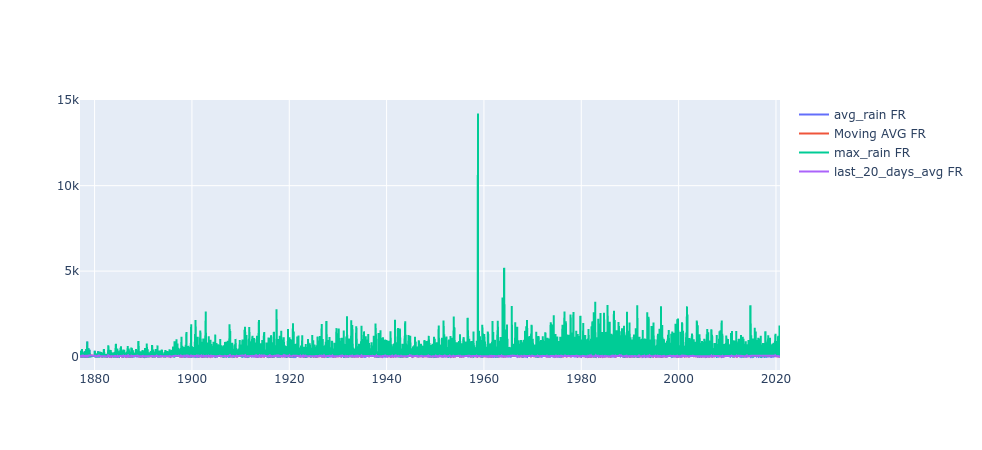

In [94]:
# import plotly.graph_objs as go
# import plotly.graph_objects as go
dfp_fr = dfp[dfp["country_ISO3"] == "FRA"]
scatter = go.Scatter(x=dfp_fr["date"], y=dfp_fr["avg_rain"], name="avg_rain FR")
# data = go.Histogram(x=dfp['avg_rain'])
fig = go.Figure(data=scatter)
_ = fig.add_scatter(
    x=dfp_fr["date"], y=dfp_fr["last_20_days_avg"], mode="lines", name="Moving AVG FR"
)
_ = fig.add_scatter(
    x=dfp_fr["date"], y=dfp_fr["max_rain"], mode="lines", name="max_rain FR"
)
_ = fig.add_scatter(
    x=dfp_fr["date"],
    y=dfp_fr["last_20_days_avg"],
    mode="lines",
    name="last_20_days_avg FR",
)

fig.show()

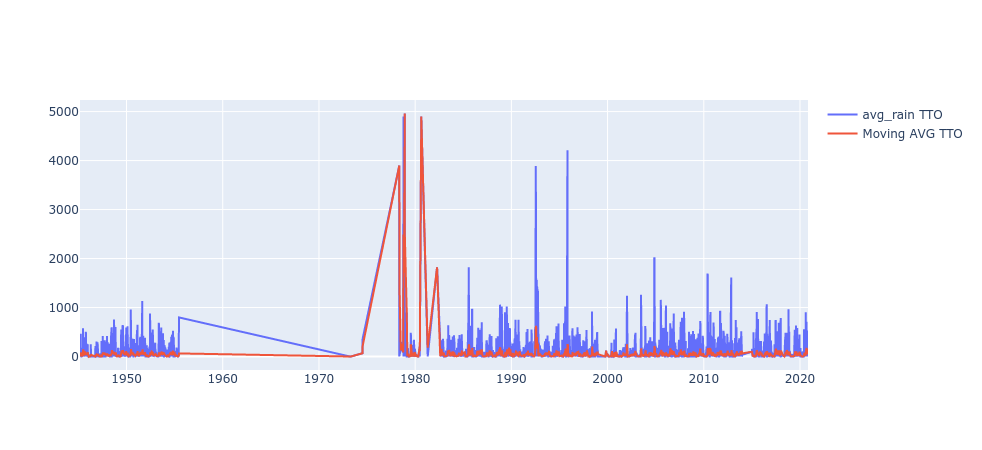

In [92]:
# import plotly.graph_objs as go
# import plotly.graph_objects as go
dfp_fr = dfp[dfp["country_ISO3"] == "TTO"]
scatter = go.Scatter(x=dfp_fr["date"], y=dfp_fr["avg_rain"], name="avg_rain TTO")
# data = go.Histogram(x=dfp['avg_rain'])
fig = go.Figure(data=scatter)
fig.add_scatter(
    x=dfp_fr["date"], y=dfp_fr["last_20_days_avg"], mode="lines", name="Moving AVG TTO"
)

# fig.show()

### Show Spark Physical plan

In [66]:
df2.orderBy(df2["avg_rain"].desc()).explain()

== Physical Plan ==
*(8) Sort [avg_rain#16 DESC NULLS LAST], true, 0
+- Exchange rangepartitioning(avg_rain#16 DESC NULLS LAST, 200), true, [id=#6307]
   +- *(7) Project [country_ISO3#1053, date#14, avg_rain#16, sum_rain#17, max_rain#18, stddev_rain#19, station_count#20, pythonUDF0#2724 AS date_new#1470]
      +- BatchEvalPython [<lambda>(date#14)], [pythonUDF0#2724]
         +- *(6) Project [date#14, avg_rain#16, sum_rain#17, max_rain#18, stddev_rain#19, station_count#20, country_ISO3#1053]
            +- *(6) SortMergeJoin [country_ISO2#15], [country_ISO2#1291], Inner
               :- *(2) Sort [country_ISO2#15 ASC NULLS FIRST], false, 0
               :  +- Exchange hashpartitioning(country_ISO2#15, 200), true, [id=#6276]
               :     +- *(1) Project [_c0#0 AS date#14, _c1#1 AS country_ISO2#15, _c2#2 AS avg_rain#16, _c3#3 AS sum_rain#17, _c4#4 AS max_rain#18, _c5#5 AS stddev_rain#19, _c6#6 AS station_count#20]
               :        +- *(1) Filter ((AtLeastNNulls(n, _c0#0,